How to train:

https://www.kaggle.com/code/vexxingbanana/sartorius-mmdetection-training

https://github.com/open-mmlab/mmdetection/blob/master/demo/MMDet_Tutorial.ipynb

https://mmdetection.readthedocs.io/en/latest/tutorials/customize_dataset.html

In [1]:
!pip install '/kaggle/input/pytorch-170-cuda-toolkit-110221/torch-1.7.0+cu110-cp37-cp37m-linux_x86_64.whl' --no-deps
!pip install '/kaggle/input/pytorch-170-cuda-toolkit-110221/torchvision-0.8.1+cu110-cp37-cp37m-linux_x86_64.whl' --no-deps
!pip install '/kaggle/input/pytorch-170-cuda-toolkit-110221/torchaudio-0.7.0-cp37-cp37m-linux_x86_64.whl' --no-deps

Processing /kaggle/input/pytorch-170-cuda-toolkit-110221/torch-1.7.0+cu110-cp37-cp37m-linux_x86_64.whl
  Attempting uninstall: torch
    Found existing installation: torch 1.11.0
    Uninstalling torch-1.11.0:
      Successfully uninstalled torch-1.11.0
Processing /kaggle/input/pytorch-170-cuda-toolkit-110221/torchvision-0.8.1+cu110-cp37-cp37m-linux_x86_64.whl
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.12.0
    Uninstalling torchvision-0.12.0:
      Successfully uninstalled torchvision-0.12.0
Processing /kaggle/input/pytorch-170-cuda-toolkit-110221/torchaudio-0.7.0-cp37-cp37m-linux_x86_64.whl
  Attempting uninstall: torchaudio
    Found existing installation: torchaudio 0.11.0
    Uninstalling torchaudio-0.11.0:
      Successfully uninstalled torchaudio-0.11.0


In [2]:
!pip install '/kaggle/input/mmdetectionv2140/addict-2.4.0-py3-none-any.whl' --no-deps
!pip install '/kaggle/input/mmdetectionv2140/yapf-0.31.0-py2.py3-none-any.whl' --no-deps
!pip install '/kaggle/input/mmdetectionv2140/terminal-0.4.0-py3-none-any.whl' --no-deps
!pip install '/kaggle/input/mmdetectionv2140/terminaltables-3.1.0-py3-none-any.whl' --no-deps
!pip install '/kaggle/input/mmdetectionv2140/mmcv_full-1_3_8-cu110-torch1_7_0/mmcv_full-1.3.8-cp37-cp37m-manylinux1_x86_64.whl' --no-deps
!pip install '/kaggle/input/mmdetectionv2140/pycocotools-2.0.2/pycocotools-2.0.2' --no-deps
!pip install '/kaggle/input/mmdetectionv2140/mmpycocotools-12.0.3/mmpycocotools-12.0.3' --no-deps

!rm -rf mmdetection

!cp -r /kaggle/input/mmdetectionv2140/mmdetection-2.14.0 /kaggle/working/
!mv /kaggle/working/mmdetection-2.14.0 /kaggle/working/mmdetection
%cd /kaggle/working/mmdetection
!pip install -e .

Processing /kaggle/input/mmdetectionv2140/addict-2.4.0-py3-none-any.whl
Processing /kaggle/input/mmdetectionv2140/yapf-0.31.0-py2.py3-none-any.whl
  Attempting uninstall: yapf
    Found existing installation: yapf 0.32.0
    Uninstalling yapf-0.32.0:
      Successfully uninstalled yapf-0.32.0
Processing /kaggle/input/mmdetectionv2140/terminal-0.4.0-py3-none-any.whl
Processing /kaggle/input/mmdetectionv2140/terminaltables-3.1.0-py3-none-any.whl
Processing /kaggle/input/mmdetectionv2140/mmcv_full-1_3_8-cu110-torch1_7_0/mmcv_full-1.3.8-cp37-cp37m-manylinux1_x86_64.whl
Processing /kaggle/input/mmdetectionv2140/pycocotools-2.0.2/pycocotools-2.0.2
  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [5 lines of output]
      running bdist_wheel
      running build
      running build_py
      creating build
      error: could not create 'build': Read-only file system
      [end of ou

In [3]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torch.nn.functional as F
import sklearn
import torchvision
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import PIL
import json
from PIL import Image, ImageEnhance
import albumentations as A
import mmdet
import mmcv
from albumentations.pytorch import ToTensorV2
import seaborn as sns
import glob
from pathlib import Path
import pycocotools
from pycocotools import mask
import numpy.random
import random
import cv2
import re
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector
from mmdet.apis import inference_detector, init_detector, show_result_pyplot, set_random_seed

In [4]:
!pip install globox

In [5]:
import numpy as np
import pandas as pd
import cv2
import os
from pathlib import Path
from sklearn.model_selection import train_test_split
import json
import shutil
import matplotlib.pyplot as plt

In [ ]:
from kaggle_secrets import UserSecretsClient
import wandb

user_secrets = UserSecretsClient()
wandb_key = user_secrets.get_secret("wandb-key")

wandb.login(key=wandb_key)

In [6]:
%cd ../

/kaggle/working


In [7]:
shutil.rmtree('./data', ignore_errors=True)
Path("./data/train/images").mkdir(parents=True, exist_ok=True)
Path("./data/train/labels").mkdir(parents=True, exist_ok=True)
Path("./data/val/images").mkdir(parents=True, exist_ok=True)
Path("./data/val/labels").mkdir(parents=True, exist_ok=True)

In [8]:
sample_subm = pd.read_csv('../input/detection-of-human-silhouettes-in-forest-images/omsk/sample_solution.csv')
train = pd.read_csv('../input/detection-of-human-silhouettes-in-forest-images/train_dataset_train/train.csv')
test_dir = '../input/detection-of-human-silhouettes-in-forest-images/test_dataset_test/test'
train_dir = '../input/detection-of-human-silhouettes-in-forest-images/train_dataset_train/train'
train_img_dir = './data/train/images'
train_labels_dir = './data/train/labels'
val_img_dir = './data/val/images'
val_labels_dir = './data/val/labels'

sample_subm['region_shape'] = sample_subm['region_shape'].astype('object')

In [9]:
val_part = pd.concat([train[train.count_region != 0].sample(frac=0.2, random_state=42), train[train.count_region == 0].sample(frac=0.01, random_state=42)])

# train_part = train[~train.isin(val_part)].dropna() # for using all images from train
train_part = train

train_part = pd.concat([train_part[train_part.count_region != 0], train_part[train_part.count_region == 0].sample(frac=0.03, random_state=42)])

In [11]:
len(train_part), len(train_part[train_part.count_region > 0]), len(val_part), len(val_part[val_part.count_region > 0])

(211, 58, 63, 12)

In [12]:
def yolobbox2bbox(x,y,w,h):
    x1, y1 = x-w/2, y-h/2
    x2, y2 = x+w/2, y+h/2
    return x1, y1, x2, y2

# Convert Coco bb to Yolo
def coco_to_yolo(x1, y1, w, h, image_w, image_h):
    return [((2*x1 + w)/(2*image_w)) , ((2*y1 + h)/(2*image_h)), w/image_w, h/image_h]

Example

0 0.6533260233918129 0.5383365821962314 0.023757309941520467 0.04223521767381416
0 25.26153846153846 13.123076923076923 0.8307692307692308 0.8307692307692308
0 39.44444444444444 14.916666666666666 1.1851851851851851 1.1851851851851851
0 26.171875 12.75 0.625 0.625
0 43.4375 19.825 1.275 1.275
0 41.59803921568628 14.450980392156863 1.1372549019607843 1.1372549019607843



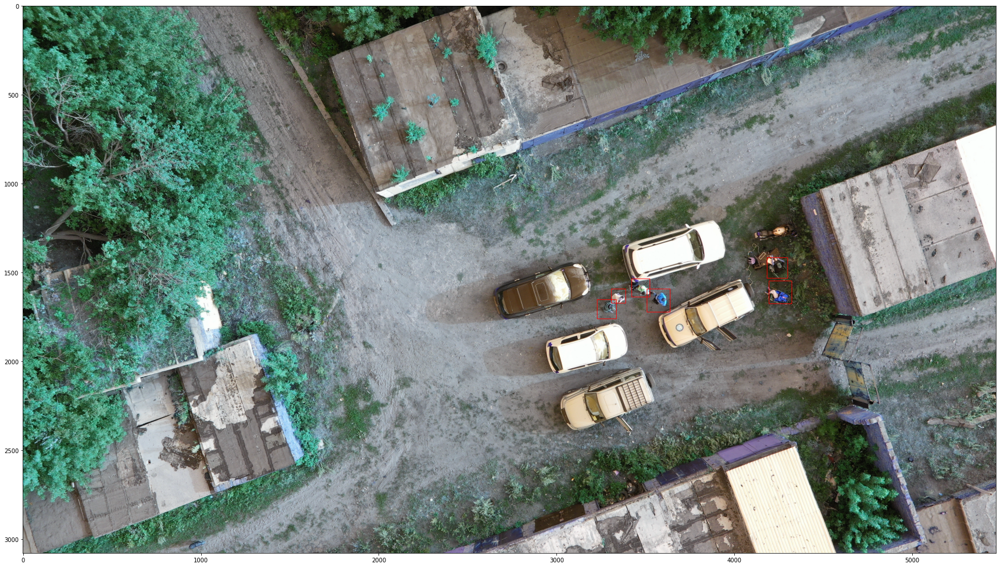

In [13]:
img = cv2.imread(f'{train_dir}/4269.JPG')
h, w = img.shape[0], img.shape[1]

coords_str = train[train.count_region != 0].iloc[6]['region_shape'].replace("'", "")
circle_coords = json.loads(coords_str)
yolo_coords_f = ''
for item in circle_coords:
    cx = item['cx']
    cy = item['cy']
    r = int(item['r'] // 1.5)
#     r = item['r']
    top_left_cornel = (cx - r, cy - r)
    bottom_right_cornel = (cx + r, cy + r)

    yolo_coords = coco_to_yolo(*top_left_cornel, bottom_right_cornel[0] - top_left_cornel[0], bottom_right_cornel[1] - top_left_cornel[1], w, h)
    x1, y1 = top_left_cornel[0], top_left_cornel[1]
    w, h = bottom_right_cornel[0] - top_left_cornel[0], bottom_right_cornel[1] - top_left_cornel[1]
    img = cv2.rectangle(img, (x1, y1), (x1+w, y1+h), (255,0,0), 2)
    
    label = '0 ' + ' '.join(list(map(str, yolo_coords))) + '\n'
    yolo_coords_f = yolo_coords_f + label
plt.figure(figsize=(30, 20))
plt.imshow(img)
print(yolo_coords_f)

In [14]:
def create_lables(df ,train_img_dir, train_labels_dir):
    print('imgs with labels: \n')
    for i, row in df.iterrows():
        shutil.copy(f'{train_dir}/{row["ID_img"]}', train_img_dir)
        if row['count_region'] == 0:
            open(f'{train_labels_dir}/{row["ID_img"].split(".")[0]}.txt', 'a').close()
        else:
            print(f'{train_img_dir}/{row["ID_img"]}')
            img = cv2.imread(f'{train_img_dir}/{row["ID_img"]}')
            h, w = img.shape[0], img.shape[1]

            coords_str = row['region_shape'].replace("'", "")
            circle_coords = json.loads(coords_str)
            yolo_coords_f = ''

            for item in circle_coords:
                cx = item['cx']
                cy = item['cy']
                r = item['r']
                top_left_cornel = (cx - r, cy - r)
                bottom_right_cornel = (cx + r, cy + r)

                yolo_coords = coco_to_yolo(*top_left_cornel, bottom_right_cornel[0] - top_left_cornel[0], bottom_right_cornel[1] - top_left_cornel[1], w, h)

                label = '0 ' + ' '.join(list(map(str, yolo_coords))) + '\n'
                yolo_coords_f = yolo_coords_f + label
            with open(f'{train_labels_dir}/{row["ID_img"].split(".")[0]}.txt', 'a') as label_txt:
                label_txt.write(yolo_coords_f)

In [15]:
create_lables(train_part, train_img_dir, train_labels_dir)
create_lables(val_part, val_img_dir, val_labels_dir)

imgs with labels: 

./data/train/images/3444.jpg
./data/train/images/3653.JPG
./data/train/images/3690.JPG
./data/train/images/3835.JPG
./data/train/images/3947.JPG
./data/train/images/4153.jpg
./data/train/images/4269.JPG
./data/train/images/4291.JPG
./data/train/images/4465.JPG
./data/train/images/4604.JPG
./data/train/images/4780.JPG
./data/train/images/4871.jpg
./data/train/images/4888.JPG
./data/train/images/4934.JPG
./data/train/images/5065.JPG
./data/train/images/5191.JPG
./data/train/images/5277.JPG
./data/train/images/5314.JPG
./data/train/images/5478.JPG
./data/train/images/5680.jpg
./data/train/images/5824.JPG
./data/train/images/5956.JPG
./data/train/images/6105.JPG
./data/train/images/6146.JPG
./data/train/images/6153.JPG
./data/train/images/6219.JPG
./data/train/images/6221.JPG
./data/train/images/6233.JPG
./data/train/images/6368.JPG
./data/train/images/6478.jpg
./data/train/images/6561.JPG
./data/train/images/6684.JPG
./data/train/images/6714.jpg
./data/train/images/674

### Convert labels

In [17]:
# rename JPG to jpg

def rename_jpg_ext(folder: str):
    for path, dirs, files in os.walk(folder):
        for file in files:
            pieces = list(os.path.splitext(file))
            if pieces[-1] == '.JPG':
                pieces[-1] = pieces[-1] = '.jpg'
                new_name = "".join(pieces)
                os.rename(os.path.join(path, file), os.path.join(path, new_name))
                
rename_jpg_ext("./data/train/images/")
rename_jpg_ext("./data/val/images/")      

In [18]:
from globox import AnnotationSet

def yolo_to_coco(image_dir: str, labels_dir: str, coco_ds_name: str, label_to_id):
    yolo_annotations = AnnotationSet.from_yolo(
        folder = Path(labels_dir),
        image_folder = Path(image_dir))
    annot = yolo_annotations.to_coco( 
        label_to_id= label_to_id,
        auto_ids = True, verbose=False)
    
    for a in annot['annotations']:
        a['area'] = a['bbox'][2]*a['bbox'][3] 
     
    annot['categories'] = [{"supercategory": "none", "id": i, "name": l} for l, i in label_to_id.items()]
    
    with open(coco_ds_name, "w") as f:
            json.dump(annot, fp=f, allow_nan=False)

yolo_to_coco(train_img_dir, train_labels_dir, './train.json', {'human': 0})
yolo_to_coco(val_img_dir, val_labels_dir, './val.json', {'human': 0})

In [19]:
with open("/kaggle/working/classes.txt", "w") as classes:
    classes.write("human")

### Install MMDet

In [ ]:
# Check nvcc version
# !nvcc -V
# Check GCC version
# !gcc --version

In [ ]:
# install dependencies: (use cu111 because colab has CUDA 11.1)
# !pip install torch==1.9.0+cu111 torchvision==0.10.0+cu111 -f https://download.pytorch.org/whl/torch_stable.html

# install mmcv-full thus we could use CUDA operators
# !pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html

# Install mmdetection
# !rm -rf mmdetection
# !git clone https://github.com/open-mmlab/mmdetection.git
# %cd mmdetection

# !pip install -e .

In [ ]:
# from mmcv import collect_env
# collect_env()

In [ ]:
# Check Pytorch installation
# import torch, torchvision
# print(torch.__version__, torch.cuda.is_available())

# Check MMDetection installation
# import mmdet
# print(mmdet.__version__)

# Check mmcv installation
# from mmcv.ops import get_compiling_cuda_version, get_compiler_version
# print(get_compiling_cuda_version())
# print(get_compiler_version())

## Inference

In [20]:
%cd mmdetection

/kaggle/working/mmdetection


In [21]:
# We download the pre-trained checkpoints for inference and finetuning.
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth \
      -O checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth

--2022-11-04 14:34:05--  https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.252.96.43
Connecting to download.openmmlab.com (download.openmmlab.com)|47.252.96.43|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 167291982 (160M) [application/octet-stream]
Saving to: ‘checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth’

checkpoints/faster_ 100%[===================>] 159.54M  8.28MB/s    in 20s     

2022-11-04 14:34:27 (8.14 MB/s) - ‘checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth’ saved [167291982/167291982]



In [22]:
import mmcv
from mmcv.runner import load_checkpoint

from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector

# Choose to use a config and initialize the detector
config = 'configs/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco.py'
# Setup a checkpoint file to load
checkpoint = 'checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth'

# Set the device to be used for evaluation
device='cuda:0'

# Load the config
config = mmcv.Config.fromfile(config)
# Set pretrained to be None since we do not need pretrained model here
config.model.pretrained = None

# Initialize the detector
model = build_detector(config.model)

# Load checkpoint
checkpoint = load_checkpoint(model, checkpoint, map_location=device)

# Set the classes of models for inference
model.CLASSES = checkpoint['meta']['CLASSES']

# We need to set the model's cfg for inference
model.cfg = config

# Convert the model to GPU
model.to(device)
# Convert the model into evaluation mode
model.eval()

/kaggle/working/mmdetection/mmdet/core/anchor/builder.py:16: UserWarning: ``build_anchor_generator`` would be deprecated soon, please use ``build_prior_generator`` 
  '``build_anchor_generator`` would be deprecated soon, please use '


Use load_from_local loader


FasterRCNN(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): ResLayer(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
        

#### Inference the detector

In [23]:
# Use the detector to do inference
img = '../data/train/images/6854.jpg'
result = inference_detector(model, img)

/kaggle/working/mmdetection/mmdet/datasets/utils.py:68: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)
/kaggle/working/mmdetection/mmdet/core/anchor/anchor_generator.py:323: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/kaggle/working/mmdetection/mmdet/core/anchor/anchor_generator.py:360: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


In [ ]:
# Let's plot the result
# show_result_pyplot(model, img, result, score_thr=0.05)

My dataset

In [24]:
import json
with open ('../train.json', 'r') as train_json:
    train_json_ds = json.load(train_json)
# train_json_ds

#### Modify the config

In [25]:
from mmcv import Config
cfg = Config.fromfile('./configs/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_1x_coco.py')

In [26]:
from mmdet.apis import set_random_seed

In [27]:
from mmdet.apis import set_random_seed

# Modify dataset type and path
cfg.dataset_type = 'CocoDataset'
cfg.classes = ['human']
cfg.data_root = '../data'

# for head in cfg.model.roi_head.bbox_head:
#     head.num_classes = 1

cfg.data.test.type = 'CocoDataset'
cfg.data.test.data_root = '../data/val/images'
cfg.data.test.ann_file = '../../../val.json'
cfg.data.test.img_prefix = ''
cfg.data.test.classes = ('human',)

cfg.data.train.type = 'CocoDataset'
cfg.data.train.data_root = '../data/train/images'
cfg.data.train.ann_file = '../../../train.json'
cfg.data.train.img_prefix = ''
cfg.data.train.classes = ('human',)

cfg.data.val.type = 'CocoDataset'
cfg.data.val.data_root = '../data/val/images'
cfg.data.val.ann_file = '../../../val.json'
cfg.data.val.img_prefix = ''
cfg.data.val.classes = ('human',)

# modify num classes of the model in box head
cfg.model.roi_head.bbox_head.type = 'Shared2FCBBoxHead'
cfg.model.roi_head.bbox_head.num_classes = 1

# If we need to finetune a model based on a pre-trained detector, we need to
# use load_from to set the path of checkpoints.
cfg.load_from = 'checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth'

# Set up working dir to save files and logs.
cfg.work_dir = './tutorial_exps'

# The original learning rate (LR) is set for 8-GPU training.
# We divide it by 8 since we only use one GPU.
cfg.optimizer.lr = 0.02 / 8
cfg.lr_config.warmup = None
cfg.log_config.interval = 10

# Change the evaluation metric since we use customized dataset.

# cfg.evaluation.metric = 'mAP
cfg.evaluation.metric = 'bbox'# 
# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 12
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 12

# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

def is_mlu_available():
    """Returns a bool indicating if MLU is currently available."""
    return hasattr(torch, 'is_mlu_available') and torch.is_mlu_available()


def get_device():
    """Returns an available device, cpu, cuda or mlu."""
    is_device_available = {
        'cuda': torch.cuda.is_available(),
        'mlu': is_mlu_available()
    }
    device_list = [k for k, v in is_device_available.items() if v]
    return device_list[0] if len(device_list) == 1 else 'cpu'

cfg.device = get_device()

cfg['runner']['max_epochs'] = 48
cfg['data']['samples_per_gpu'] = 4

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]

# wandb
# cfg.log_config.hooks = [
#     dict(type='TextLoggerHook'),
#     dict(type='MMDetWandbHook',
#          init_kwargs={'project': 'mmdetection'},
#          interval=10,
#          log_checkpoint=True,
#          log_checkpoint_metadata=True,
#          num_eval_images=100,
#          bbox_score_thr=0.3)]


# We can initialize the logger for training and have a look
# at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
model = dict(
    type='FasterRCNN',
    backbone=dict(
        type='ResNet',
        depth=50,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=1,
        norm_cfg=dict(type='BN', requires_grad=False),
        norm_eval=True,
        style='caffe',
        init_cfg=dict(
            type='Pretrained',
            checkpoint='open-mmlab://detectron2/resnet50_caffe')),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=5),
    rpn_head=dict(
        type='RPNHead',
        in_channels=256,
        feat_channels=256,
        anchor_generator=dict(
            type='AnchorGenerator',
            scales=[8],
            ratios=[0.5, 1.0, 2.0],
            strides=[4, 8, 16, 32, 64]),
        bbox_coder=dict(
            type='DeltaXYWHBBoxCoder',
            target_means=[0.0, 0.0, 0.0, 0.0],
            target_stds=[1.0, 1.0, 1.0, 1.0]),
        loss_cls=dict(
            type='Cro

#### train a new detector

In [28]:
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector

import os.path as osp

# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_detector(cfg.model)
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


2022-11-04 14:34:59,898 - mmdet - INFO - load checkpoint from checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth
2022-11-04 14:34:59,899 - mmdet - INFO - Use load_from_local loader
2022-11-04 14:35:00,037 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([2, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([2]).
size mismatch for roi_head.bbox_head.fc_reg.weight: copying a param with shape torch.Size([320, 1024]) from checkpoint, the shape in current model is torch.Size([4, 1024]).
size mismatch for roi_head.bbox_head.fc_reg.bias: copying a param with shape torch.Size([320]) from checkpoint, the shape in current model is torch.Size([4]).
2022-11-04 14:35:00,042 - m

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


/kaggle/working/mmdetection/mmdet/core/anchor/anchor_generator.py:323: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/kaggle/working/mmdetection/mmdet/core/anchor/anchor_generator.py:360: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '
2022-11-04 14:35:20,854 - mmdet - INFO - Epoch [1][10/15]	lr: 2.500e-03, eta: 0:19:44, time: 1.668, data_time: 0.834, memory: 6891, loss_rpn_cls: 0.1012, loss_rpn_bbox: 0.0327, loss_cls: 0.1823, acc: 97.0020, loss_bbox: 0.0922, loss: 0.4083
2022-11-04 14:35:43,796 - mmdet - INFO - Epoch [2][10/15]	lr: 2.500e-03, eta: 0:15:38, time: 1.708, data_time: 1.117, memory: 6891, loss_rpn_cls: 0.0301, loss_rpn_bbox: 0.0170, loss_cls: 0.1524, acc: 94.7363, loss_bbox: 0.2124, loss: 0.4119
2022-11-04 14:36:06,215 - mmdet - INFO - Epoch [3][10/15]	l

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 63/63, 6.9 task/s, elapsed: 9s, ETA:     0s

2022-11-04 14:40:07,755 - mmdet - INFO - Evaluating bbox...
2022-11-04 14:40:07,802 - mmdet - INFO - Epoch(val) [12][63]	bbox_mAP: 0.2740, bbox_mAP_50: 0.7490, bbox_mAP_75: 0.1610, bbox_mAP_s: -1.0000, bbox_mAP_m: 0.1000, bbox_mAP_l: 0.2890, bbox_mAP_copypaste: 0.274 0.749 0.161 -1.000 0.100 0.289


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.274
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.749
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.161
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.100
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.289
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.495
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.495
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.495
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | max

2022-11-04 14:40:24,286 - mmdet - INFO - Epoch [13][10/15]	lr: 2.500e-05, eta: 0:10:33, time: 1.616, data_time: 1.046, memory: 7039, loss_rpn_cls: 0.0059, loss_rpn_bbox: 0.0142, loss_cls: 0.1135, acc: 94.9512, loss_bbox: 0.2158, loss: 0.3495
2022-11-04 14:40:46,984 - mmdet - INFO - Epoch [14][10/15]	lr: 2.500e-05, eta: 0:10:10, time: 1.567, data_time: 1.001, memory: 7039, loss_rpn_cls: 0.0037, loss_rpn_bbox: 0.0146, loss_cls: 0.0987, acc: 95.6250, loss_bbox: 0.1932, loss: 0.3102
2022-11-04 14:41:10,203 - mmdet - INFO - Epoch [15][10/15]	lr: 2.500e-05, eta: 0:09:49, time: 1.674, data_time: 1.084, memory: 7039, loss_rpn_cls: 0.0049, loss_rpn_bbox: 0.0124, loss_cls: 0.1181, acc: 94.8486, loss_bbox: 0.2282, loss: 0.3636
2022-11-04 14:41:32,350 - mmdet - INFO - Epoch [16][10/15]	lr: 2.500e-05, eta: 0:09:28, time: 1.605, data_time: 1.021, memory: 7039, loss_rpn_cls: 0.0076, loss_rpn_bbox: 0.0124, loss_cls: 0.1064, acc: 95.2100, loss_bbox: 0.1984, loss: 0.3248
2022-11-04 14:41:55,355 - mmdet 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 63/63, 7.0 task/s, elapsed: 9s, ETA:     0s

2022-11-04 14:44:49,965 - mmdet - INFO - Evaluating bbox...
2022-11-04 14:44:50,009 - mmdet - INFO - Epoch(val) [24][63]	bbox_mAP: 0.2830, bbox_mAP_50: 0.8110, bbox_mAP_75: 0.2080, bbox_mAP_s: -1.0000, bbox_mAP_m: 0.1000, bbox_mAP_l: 0.2990, bbox_mAP_copypaste: 0.283 0.811 0.208 -1.000 0.100 0.299


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.283
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.811
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.208
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.100
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.299
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.505
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.505
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.505
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | max

2022-11-04 14:45:06,385 - mmdet - INFO - Epoch [25][10/15]	lr: 2.500e-05, eta: 0:06:39, time: 1.607, data_time: 1.030, memory: 7039, loss_rpn_cls: 0.0055, loss_rpn_bbox: 0.0151, loss_cls: 0.1130, acc: 95.0391, loss_bbox: 0.2137, loss: 0.3473
2022-11-04 14:45:32,288 - mmdet - INFO - Epoch [26][10/15]	lr: 2.500e-05, eta: 0:06:24, time: 1.934, data_time: 1.324, memory: 7039, loss_rpn_cls: 0.0042, loss_rpn_bbox: 0.0105, loss_cls: 0.1019, acc: 95.5273, loss_bbox: 0.1904, loss: 0.3070
2022-11-04 14:45:57,650 - mmdet - INFO - Epoch [27][10/15]	lr: 2.500e-05, eta: 0:06:07, time: 1.796, data_time: 1.180, memory: 7039, loss_rpn_cls: 0.0059, loss_rpn_bbox: 0.0135, loss_cls: 0.1030, acc: 95.7422, loss_bbox: 0.1937, loss: 0.3162
2022-11-04 14:46:23,258 - mmdet - INFO - Epoch [28][10/15]	lr: 2.500e-05, eta: 0:05:51, time: 1.915, data_time: 1.286, memory: 7039, loss_rpn_cls: 0.0049, loss_rpn_bbox: 0.0147, loss_cls: 0.1133, acc: 94.9805, loss_bbox: 0.2231, loss: 0.3560
2022-11-04 14:46:47,275 - mmdet 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 63/63, 7.6 task/s, elapsed: 8s, ETA:     0s

2022-11-04 14:49:56,772 - mmdet - INFO - Evaluating bbox...
2022-11-04 14:49:56,814 - mmdet - INFO - Epoch(val) [36][63]	bbox_mAP: 0.2960, bbox_mAP_50: 0.8120, bbox_mAP_75: 0.1850, bbox_mAP_s: -1.0000, bbox_mAP_m: 0.1000, bbox_mAP_l: 0.3120, bbox_mAP_copypaste: 0.296 0.812 0.185 -1.000 0.100 0.312


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.296
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.812
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.185
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.100
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.312
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.495
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.495
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.495
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | max

2022-11-04 14:50:14,482 - mmdet - INFO - Epoch [37][10/15]	lr: 2.500e-05, eta: 0:03:17, time: 1.736, data_time: 1.135, memory: 7039, loss_rpn_cls: 0.0054, loss_rpn_bbox: 0.0122, loss_cls: 0.1022, acc: 95.4443, loss_bbox: 0.1989, loss: 0.3187
2022-11-04 14:50:37,270 - mmdet - INFO - Epoch [38][10/15]	lr: 2.500e-05, eta: 0:02:59, time: 1.628, data_time: 1.059, memory: 7039, loss_rpn_cls: 0.0029, loss_rpn_bbox: 0.0110, loss_cls: 0.1050, acc: 95.4736, loss_bbox: 0.2070, loss: 0.3260
2022-11-04 14:50:59,665 - mmdet - INFO - Epoch [39][10/15]	lr: 2.500e-05, eta: 0:02:41, time: 1.555, data_time: 1.103, memory: 7039, loss_rpn_cls: 0.0039, loss_rpn_bbox: 0.0127, loss_cls: 0.1042, acc: 95.4590, loss_bbox: 0.1932, loss: 0.3140
2022-11-04 14:51:23,861 - mmdet - INFO - Epoch [40][10/15]	lr: 2.500e-05, eta: 0:02:24, time: 1.731, data_time: 1.172, memory: 7039, loss_rpn_cls: 0.0036, loss_rpn_bbox: 0.0127, loss_cls: 0.1051, acc: 95.5029, loss_bbox: 0.1983, loss: 0.3196
2022-11-04 14:51:46,785 - mmdet 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 63/63, 7.8 task/s, elapsed: 8s, ETA:     0s

2022-11-04 14:54:47,034 - mmdet - INFO - Evaluating bbox...
2022-11-04 14:54:47,075 - mmdet - INFO - Epoch(val) [48][63]	bbox_mAP: 0.3040, bbox_mAP_50: 0.7940, bbox_mAP_75: 0.1750, bbox_mAP_s: -1.0000, bbox_mAP_m: 0.1000, bbox_mAP_l: 0.3210, bbox_mAP_copypaste: 0.304 0.794 0.175 -1.000 0.100 0.321


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.304
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.794
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.175
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.100
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.321
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.509
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.509
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.509
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | max

In [ ]:
# load tensorboard in colab
# %load_ext tensorboard

# see curves in tensorboard
# %tensorboard --logdir ./tutorial_exps

### Test the Trained Detector

In [29]:
img = mmcv.imread('../data/train/images/4269.jpg')

model.cfg = cfg
result = inference_detector(model, img)
# show_result_pyplot(model.to(device), img, result, score_thr=0.75)

/kaggle/working/mmdetection/mmdet/datasets/utils.py:68: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)
/kaggle/working/mmdetection/mmdet/core/anchor/anchor_generator.py:323: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/kaggle/working/mmdetection/mmdet/core/anchor/anchor_generator.py:360: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


/kaggle/working/mmdetection/mmdet/core/anchor/anchor_generator.py:323: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/kaggle/working/mmdetection/mmdet/core/anchor/anchor_generator.py:360: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


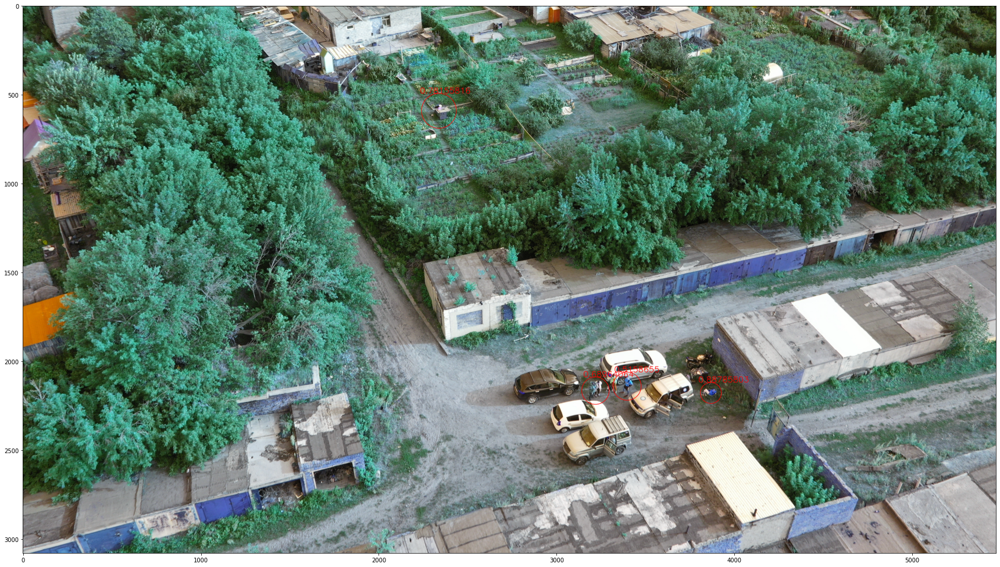

In [65]:
def visualize_predict(img_path, thrh=0.45, circles=True, put_score=True):

    img = mmcv.imread(img_path)
    result = inference_detector(model, img)

    coords_arr = result[0]
    
    for item in coords_arr:
        if item[4] > thrh:
            cx = int((item[2] + item[0]) // 2)
            cy = int((item[3] + item[1]) // 2)
            r = int(item[3] - item[1]) // 2

            w = int((item[2] - item[0]))
            h = int((item[3] - item[1]))

            x1 = int(item[0])
            y1 = int(item[1])
            
            if circles:
                img = cv2.circle(img, (cx, cy), r, (255,0,0), 2)
            else:
                img = cv2.rectangle(img, (x1, y1), (x1+w, y1+h), (255,0,0), 2)
            if put_score:
                img = cv2.putText(img, str(item[4]), (int(item[0]), int(item[1])), cv2.FONT_HERSHEY_SIMPLEX, 1.5, 255, 2)

    plt.figure(figsize=(30, 20))
    plt.imshow(img)
    
visualize_predict('../../input/detection-of-human-silhouettes-in-forest-images/test_dataset_test/test/890.JPG', thrh = 0.45, circles = True, put_score=True)

Predict test data

In [37]:
import pandas as pd
sample_subm = pd.read_csv('../../input/detection-of-human-silhouettes-in-forest-images/omsk/sample_solution.csv')
sample_subm['region_shape'] = sample_subm['region_shape'].astype('object')
sample_subm.head()

,ID_img,region_shape
0,1.JPG,0
1,2.JPG,0
2,3.JPG,0
3,4.JPG,0
4,5.JPG,0


In [110]:
%%time

test_image_dir = '../../input/detection-of-human-silhouettes-in-forest-images/test_dataset_test/test'
boxes_count_all = 0

thrh = 0.87

for i, row in sample_subm.iterrows():
    img = mmcv.imread(f'{test_image_dir}/{row.ID_img}')
    result = inference_detector(model, img)
    
    predict_region_shape = ''
    cxs, cys, rs = [], [], []
    
    for box in result[0]:
        if box[4] > thrh:
            cx = int((box[2] + box[0]) // 2)
            cy = int((box[3] + box[1]) // 2)
#             r = int(box[3] - box[1]) // 2
            r = int((int(box[3] - box[1]) // 2) // 1.5)
            boxes_count_all += 1
            cxs.append(cx)
            cys.append(cy)
            rs.append(r)
    if len(rs) > 0:
        circles = sorted(zip(cxs, cys,rs))
        arr_coords = [f'{{"cx":{cx}, "cy":{cy}, "r":{r}}}' for (cx, cy, rs) in circles]
        sample_subm.at[i, 'region_shape'] = arr_coords
    else:
        sample_subm.at[i, 'region_shape'] = 0 

CPU times: user 6min 18s, sys: 8.61 s, total: 6min 27s
Wall time: 6min 21s


In [106]:
len(sample_subm[sample_subm.region_shape != 0]), boxes_count_all

(76, 116)

In [107]:
sample_subm[sample_subm.region_shape != 0].head(15)

,ID_img,region_shape
36,37.JPG,"[{""cx"":3292, ""cy"":1827, ""r"":102}]"
47,48.JPG,"[{""cx"":2760, ""cy"":1056, ""r"":106}]"
63,64.jpg,"[{""cx"":2124, ""cy"":2093, ""r"":103}, {""cx"":3113, ..."
78,79.JPG,"[{""cx"":3117, ""cy"":262, ""r"":115}]"
336,337.jpg,"[{""cx"":1633, ""cy"":260, ""r"":87}, {""cx"":1789, ""c..."
338,339.JPG,"[{""cx"":599, ""cy"":426, ""r"":22}]"
342,343.JPG,"[{""cx"":617, ""cy"":173, ""r"":18}]"
416,417.JPG,"[{""cx"":1906, ""cy"":1304, ""r"":97}, {""cx"":1917, ""..."
449,450.JPG,"[{""cx"":408, ""cy"":233, ""r"":19}]"
497,498.JPG,"[{""cx"":199, ""cy"":239, ""r"":19}, {""cx"":257, ""cy""..."


In [111]:
sample_subm.to_csv('../frcnn_60ep_0_87_small_r.csv', index = False)

draw some iamges with predicted circles

/kaggle/working/mmdetection/mmdet/core/anchor/anchor_generator.py:323: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/kaggle/working/mmdetection/mmdet/core/anchor/anchor_generator.py:360: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


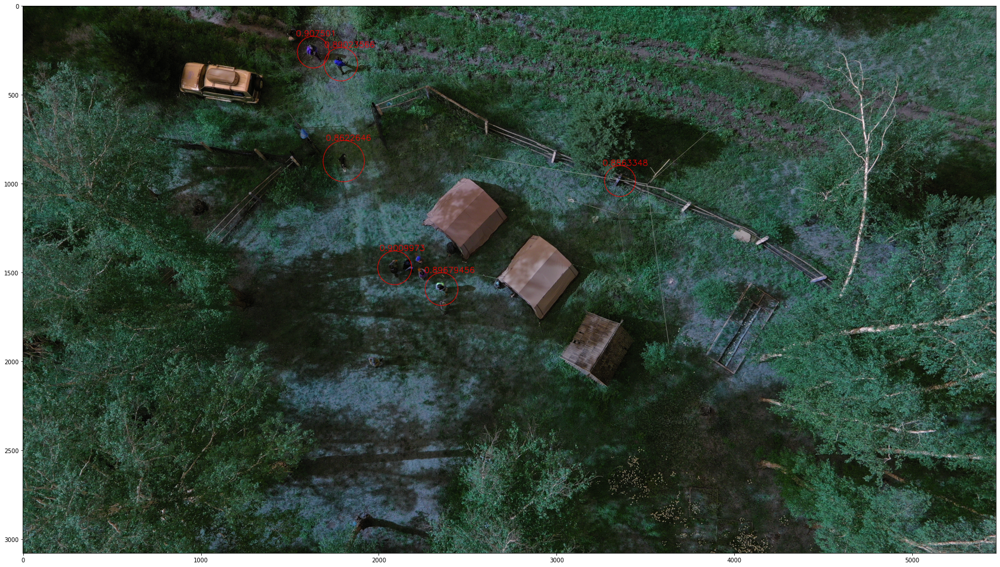

In [109]:
visualize_predict('../../input/detection-of-human-silhouettes-in-forest-images/test_dataset_test/test/337.jpg', thrh = 0.85, circles = True, put_score=True)

In [ ]:
f1_score(preds.label_ids, np.argmax(preds.predictions, axis=1), average='macro')